https://github.com/udacity/CarND-Advanced-Lane-Lines

https://github.com/udacity/CarND-Camera-Calibration

http://onlinemanuals.txdot.gov/txdotmanuals/rdw/horizontal_alignment.htm#BGBHGEGC


    ******

https://github.com/pkern90/CarND-advancedLaneLines

https://github.com/udacity/CarND-Advanced-Lane-Lines/blob/master/writeup_template.md

https://github.com/JustinHeaton/Advanced-Lane-Finding

https://github.com/wonjunee/Advanced-Lane-Finding

https://github.com/Dalaska?tab=repositories
    
    ****

https://www.youtube.com/watch?v=vWY8YUayf9Q&feature=youtu.be    

In [1]:
%%HTML
<style> code {background-color : pink !important;} </style>

In [2]:
import numpy as np
import os
import cv2
import glob
import pickle
from scipy import signal
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import find_peaks_cwt
from moviepy.editor import VideoFileClip
%matplotlib inline

In [3]:
# setup
scale = 720/1280 # Scale the 1280 image down to 720 image
nx = 9 # the number of inside corners
ny = 6 # the number of inside corners

### extract object points and image points for camera calibration

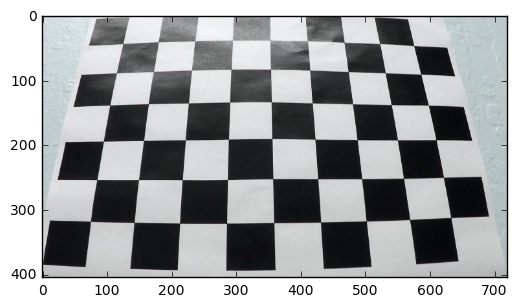

In [4]:
# load chessboard images
fname = 'camera_cal/calibration3.jpg'
img= cv2.imread(fname)
img = cv2.resize(img, (720, 405))
#img = cv2.resize(img,(int(cols*scale),int(rows*scale)))
plt.imshow(img)

[ 8.  5.  0.] [ 0.  5.  0.] [ 0.  0.  0.] [ 8.  0.  0.]


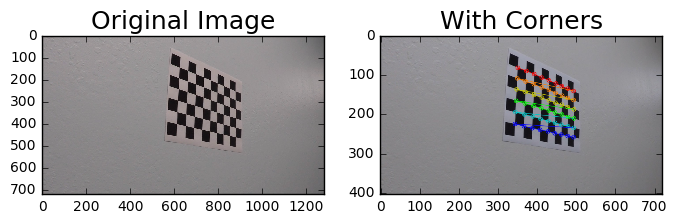

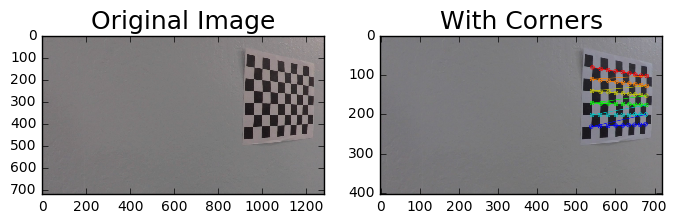

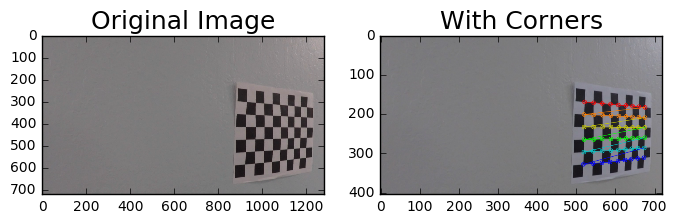

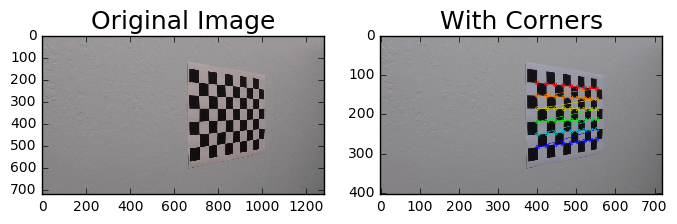

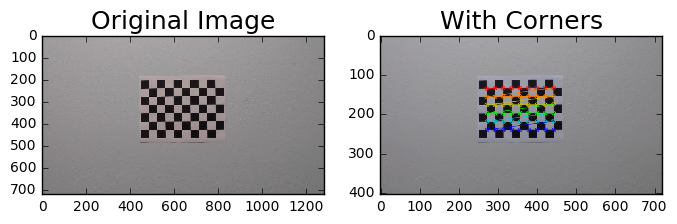

...

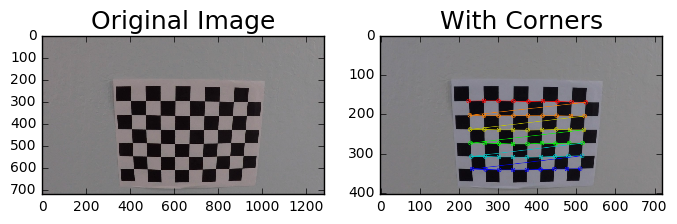

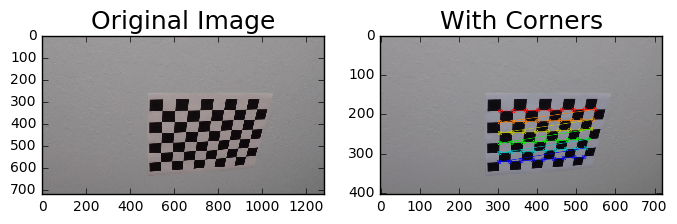

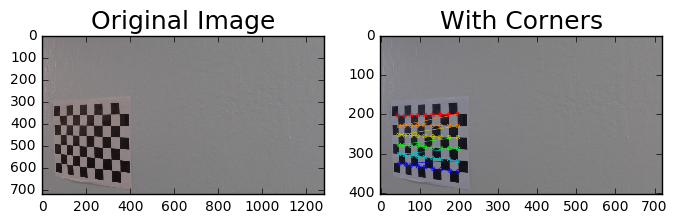

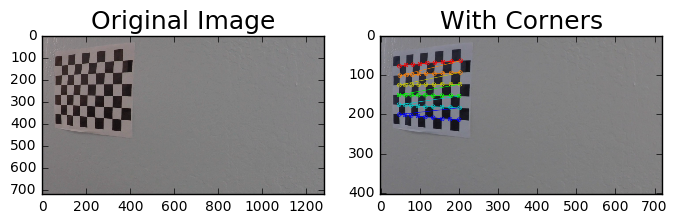

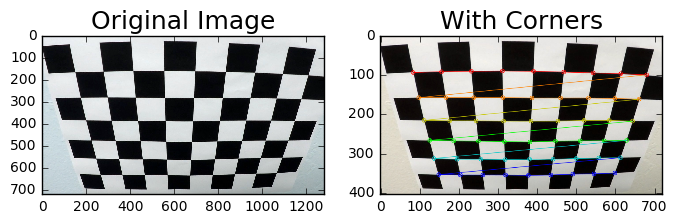

In [5]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

print(objp[-1], objp[-nx], objp[0], objp[nx-1])

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/cal*.jpg')


# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    rows,cols,chs = img.shape
    img = cv2.resize(img,(int(cols*scale),int(rows*scale)))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        """# Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)"""
        
        #Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('With Corners', fontsize=18)
#cv2.destroyAllWindows()

Actual corners coordinates: [[ 691.52172852  318.43325806]] [[ 518.4175415   330.48565674]] [[ 521.965271    170.07933044]] [[ 693.95458984  181.87382507]]


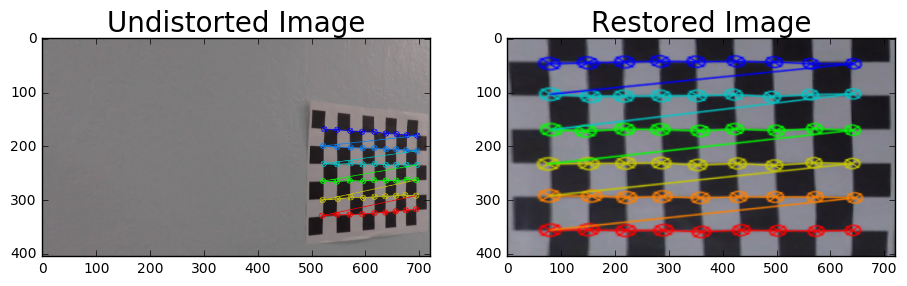

In [6]:
# Read in the saved camera matrix and distortion coefficients
# These are the arrays you calculated using cv2.calibrateCamera()
dist_pickle = pickle.load( open( "camera_cal/720x540_cal_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]
# Read in an image
img = cv2.imread('camera_cal/calibration15.jpg')
rows, cols, chs = img.shape
img = cv2.resize(img,(int(cols*scale),int(rows*scale)))
#img = cv2.resize(img,(720,405))
undist = cv2.undistort(img, mtx, dist, None, mtx)
gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
rows, cols, chs = img.shape
#print(rows, cols)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
#print (corners[0], corners[-nx], corners[-1], corners[nx-1])
#print('Object point coordinates:', objp[-1], objp[-nx], objp[0], objp[nx-1])
print ('Actual corners coordinates:', corners[-1], corners[-nx], corners[0], corners[nx-1])
# If found, add object points, image points
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(undist, (nx,ny), corners, ret)
    
    offsetx = 80 # offset columns for dst points
    offsety = 48 # offset rows for dst points
    # Grab the image shape
    #img_size = (gray.shape[1], gray.shape[0])

    # For source points I'm grabbing the outer four detected corners
    src = np.float32([corners[-1], corners[-nx], corners[0], corners[nx-1]]) # 180 deg rotation
    #src = np.float32([corners[nx-1],corners[0], corners[-nx], corners[-1]])  # zero deg rotation
    
    dst = np.float32([[offsetx, offsety], [cols-offsetx, offsety], 
                                     [cols-offsetx, rows-offsety], 
                                     [offsetx, rows-offsety]])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M,(720, 405))


display = cv2.cvtColor(warped, cv2.COLOR_BGR2RGB)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11,5))
ax1.imshow(undist,cmap='gray')
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(display,cmap='gray')
ax2.set_title('Restored Image', fontsize=20)

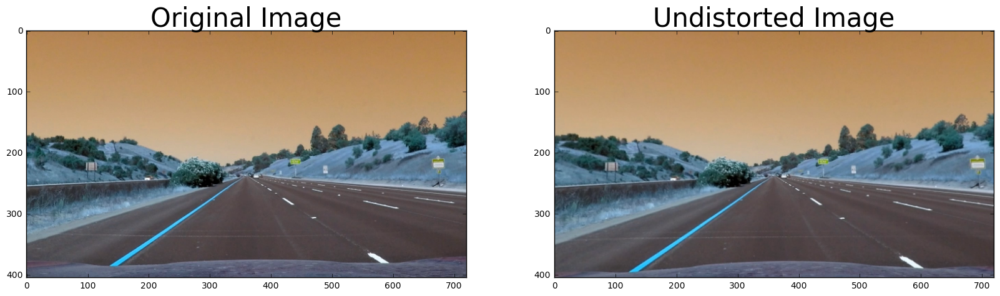

In [7]:
import pickle
%matplotlib inline
# Remove distortion from images
img = cv2.imread('test_images/straight_lines1.jpg')
img = cv2.resize(img,(720,405))
img_size = (img.shape[1], img.shape[0])
# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('calibration_wide/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "wide_dist_pickle.p", "wb" ) )

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

In [8]:
# Read in an image and grayscale it
#image = mpimg.imread('signs_vehicles_xygrad.png')

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
 
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
        # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return grad_binary

In [9]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    #return binary_output
     # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

In [10]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=15, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    #return binary_output
        # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [11]:
# Read in an image and grayscale it
#image = mpimg.imread('signs_vehicles_xygrad.png')

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
 
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
        # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return grad_binary

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    #return binary_output
     # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=15, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    #return binary_output
        # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output
# add_thresholds and return a binary image

In [58]:
# Define a function that thresholds the S-channel of HLS
def HLS_single(img, thresh=(0, 255)):
    img = np.copy(img)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

In [13]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

print("function for masking region of interest")

function for masking region of interest


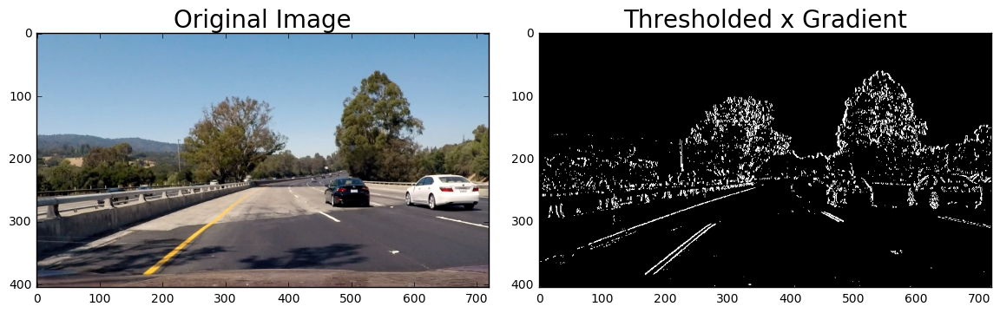

In [14]:
# Read in an image
image = mpimg.imread('test_images/test4.jpg')
image = cv2.resize(image,(720,405))
# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(30, 130))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded x Gradient', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

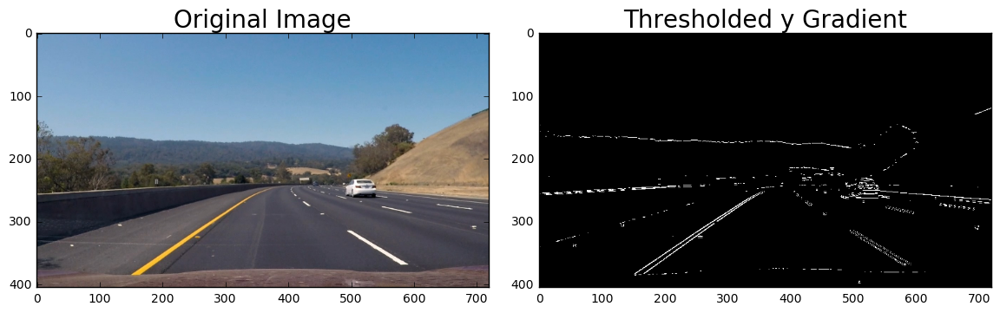

In [15]:
# Read in an image
image = mpimg.imread('test_images/test3.jpg')
image = cv2.resize(image,(720,405))
# Run the function
grad_binary = abs_sobel_thresh(image, orient='y',sobel_kernel=3, thresh=(70, 130))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded y Gradient', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

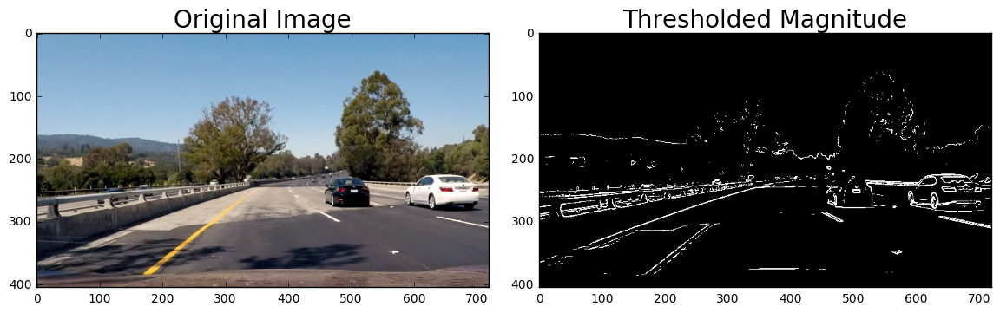

In [16]:
# Read in an image
image = mpimg.imread('test_images/test4.jpg')
image = cv2.resize(image,(720,405))
    
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(80, 255))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

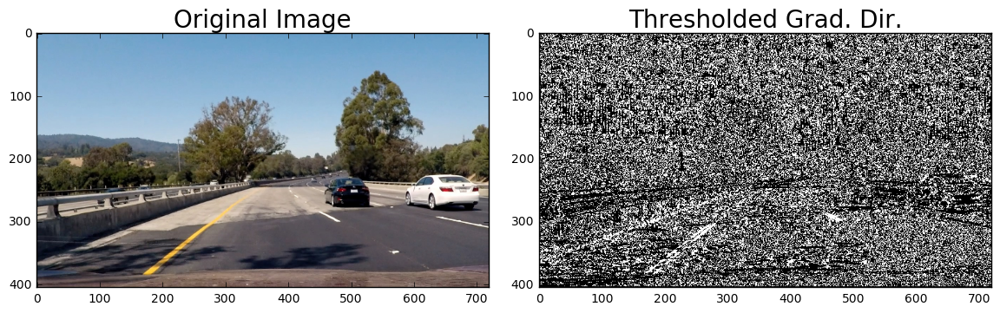

In [17]:
# Read in an image
image = mpimg.imread('test_images/test4.jpg')
image = cv2.resize(image,(720,405))
    
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=3, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

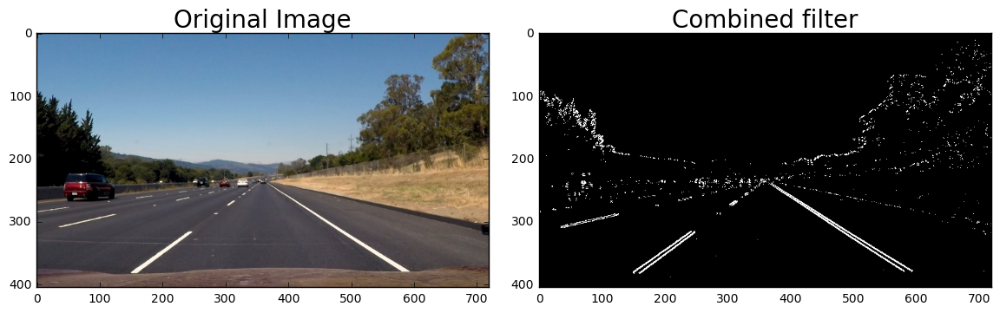

In [18]:
# Read in an image
image = mpimg.imread('test_images/straight_lines2.jpg')
image = cv2.resize(image,(720,405))


# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(30, 230))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=3, thresh=(30, 230))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(80, 150))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined filter', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [19]:
image = cv2.imread('test_images/test1.jpg')
image = cv2.resize(image, (720, 405))

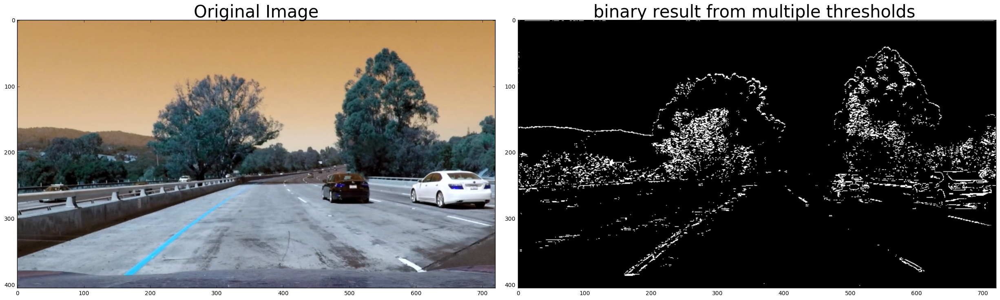

In [20]:
#image = cv2.resize(image,(720,405))
#gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements
     
# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(10,90))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(10,90))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(80,255))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
hls_binary = HLS_single(image, thresh=(70, 255))
combined = np.zeros_like(dir_binary)
#combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
combined[((grady == 1) & (grady == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1) & (hls_binary == 1))] = 1
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined, cmap='gray')
ax2.set_title('binary result from multiple thresholds ', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

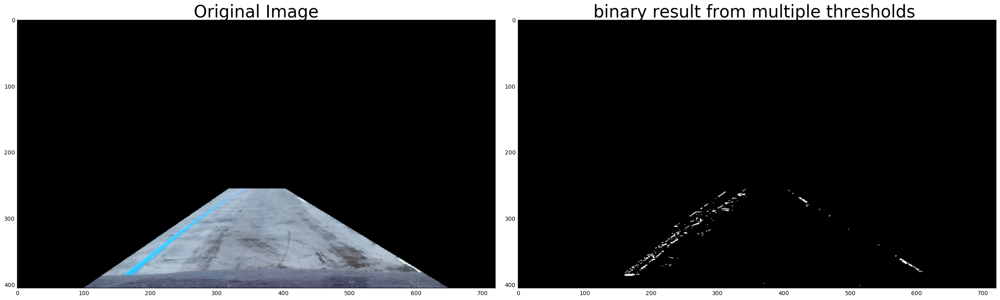

In [21]:
# Test if the region of interest works
img = cv2.imread('test_images/test1.jpg')
#img= mpimg.imread('test_images/test2.jpg')
img = cv2.resize(img,(720,405))
img_x = img.shape[1]
img_y = img.shape[0]

# select mask region
vertices = np.array([[(0.14*img_x,img_y),(0.443*img_x, 0.63*img_y),
                          (0.56*img_x, 0.63*img_y), (0.9*img_x,img_y)]], dtype=np.int32)

# test on color image
img_masked = region_of_interest(img,vertices)

#image = cv2.resize(image,(720,405))
#gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements
     
# Apply each of the thresholding functions
gradx = abs_sobel_thresh(img_masked, orient='x', sobel_kernel=ksize, thresh=(10,90))
grady = abs_sobel_thresh(img_masked, orient='y', sobel_kernel=ksize, thresh=(10,90))
mag_binary = mag_thresh(img_masked, sobel_kernel=ksize, mag_thresh=(80,255))
dir_binary = dir_threshold(img_masked, sobel_kernel=ksize, thresh=(0.7, 1.3))
hls_binary = HLS_single(img_masked, thresh=(70, 255))
combined = np.zeros_like(dir_binary)
#combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
combined[((grady == 1) & (grady == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1) & (hls_binary == 1))] = 1
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_masked)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined, cmap='gray')
ax2.set_title('binary result from multiple thresholds ', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

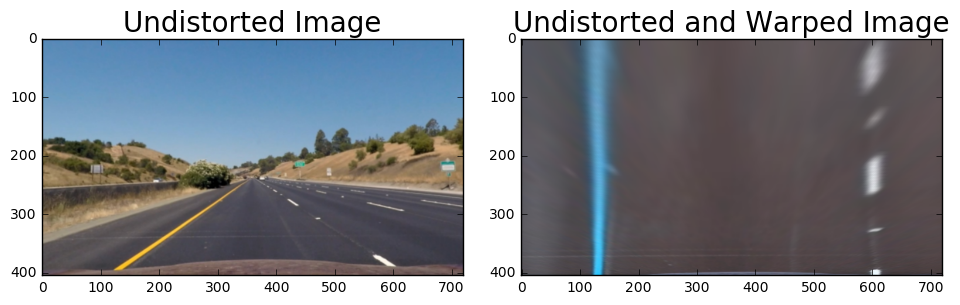

In [22]:
apex, apey = 360, 258
offset = 0
offset_far = 50
offset_near = 10
src = np.float32([[int(apex-offset_far),apey],
                  [int(apex+offset_far),apey],
                  [int(0+offset_near),390],
                  [int(720-offset_near),390]])
dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
img = cv2.imread('test_images/straight_lines1.jpg')
img = cv2.resize(img, (720, 405))
img = cv2.undistort(img, mtx, dist, None, mtx)
img= cv2.GaussianBlur(img, (3,3), 0)
img_size = (img.shape[1],img.shape[0])

M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(img, M, img_size)
    
combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(warped)
ax2.set_title('Undistorted and Warped Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

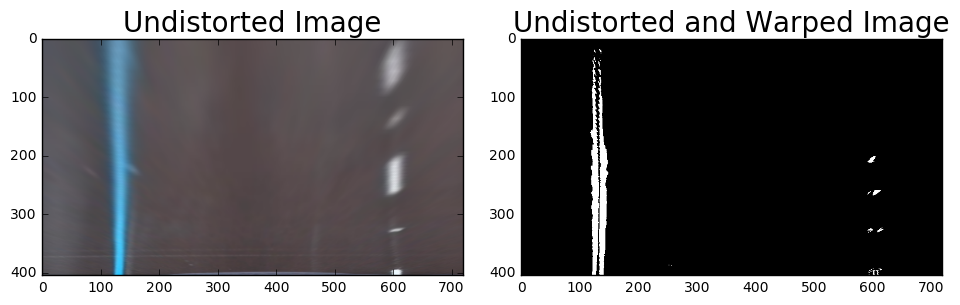

In [23]:
apex, apey = 360, 258
offset = 0
offset_far = 50
offset_near = 10
src = np.float32([[int(apex-offset_far),apey],
                  [int(apex+offset_far),apey],
                  [int(0+offset_near),390],
                  [int(720-offset_near),390]])
dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
img = cv2.imread('test_images/straight_lines1.jpg')
img = cv2.resize(img, (720, 405))
img = cv2.undistort(img, mtx, dist, None, mtx)
img= cv2.GaussianBlur(img, (3,3), 0)
img_size = (img.shape[1],img.shape[0])

M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(img, M, img_size)
gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=3, thresh=(10, 230))
grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=3, thresh=(10, 230))
mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
hls_binary = HLS_single(warped, thresh=(90, 255))
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
f.tight_layout()
ax1.imshow(warped)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(combined,cmap='gray')
ax2.set_title('Undistorted and Warped Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

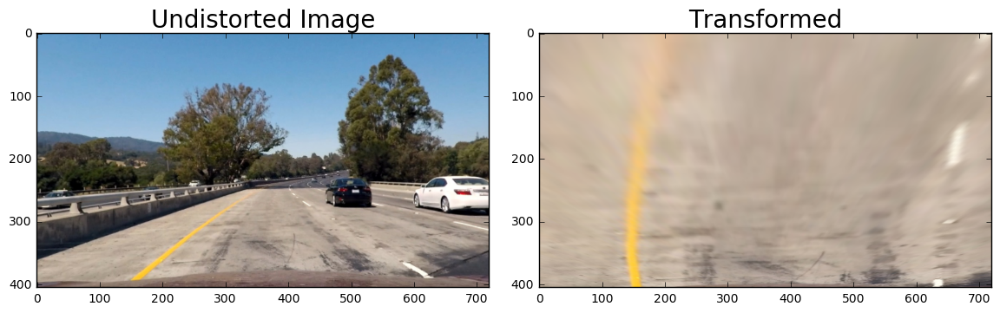

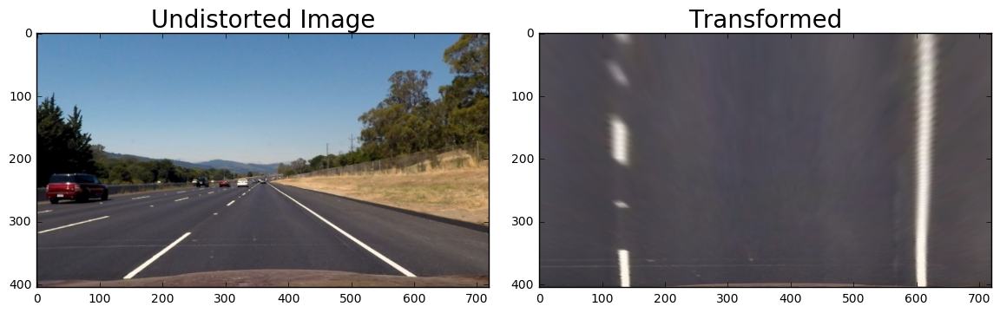

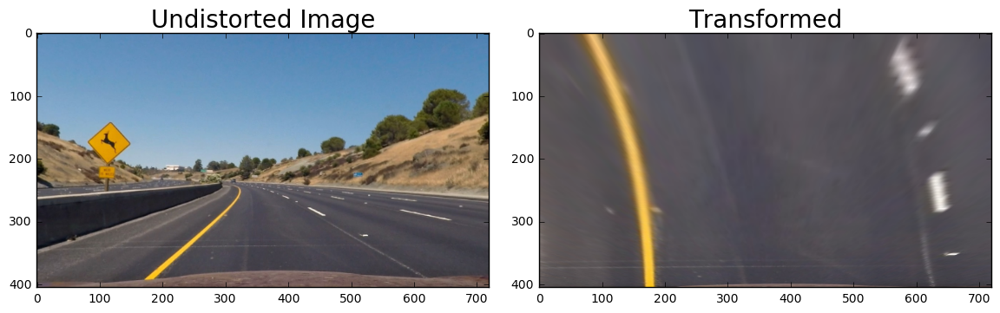

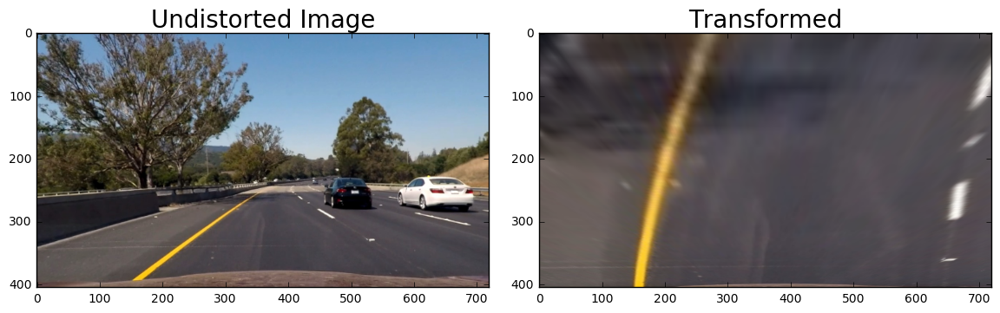

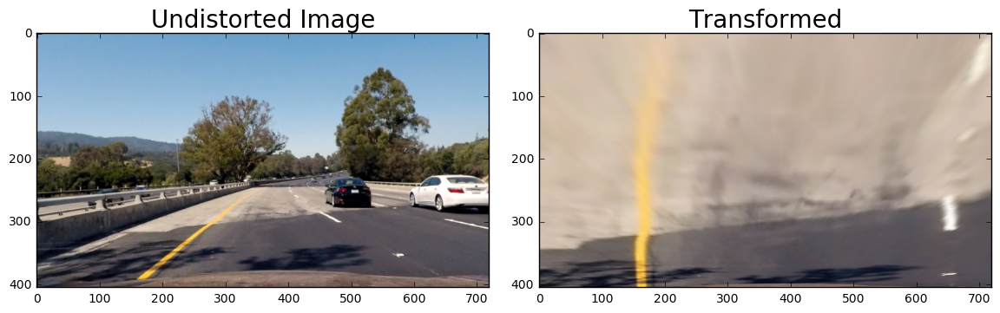

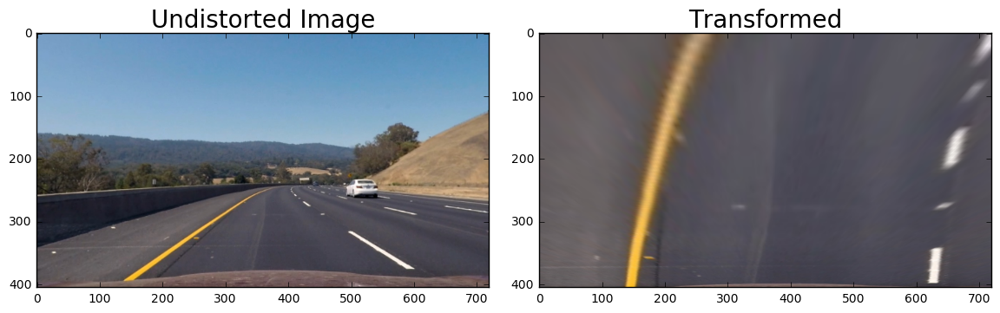

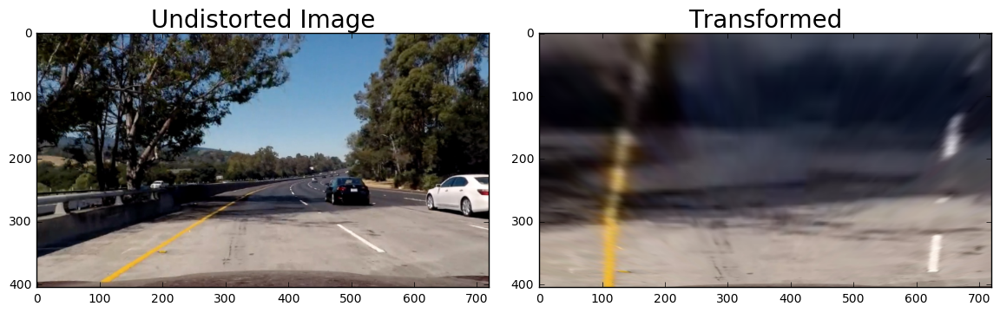

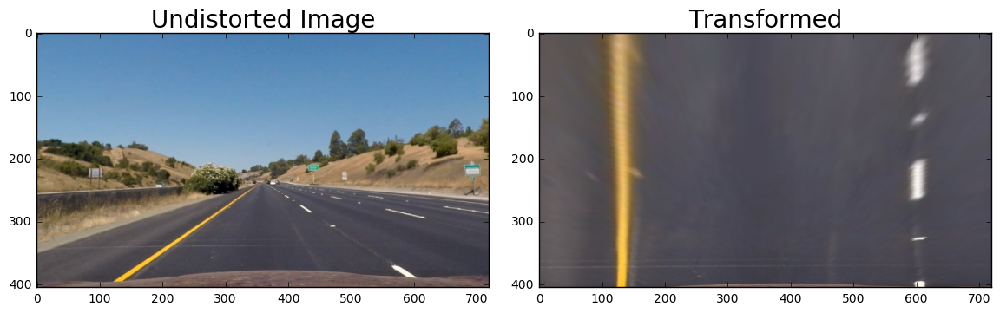

In [24]:
apex, apey = 360, 258
offset_far = 50
offset_near = 10
src = np.float32([[int(apex-offset_far),apey],
                  [int(apex+offset_far),apey],
                  [int(0+offset_near),390],
                  [int(720-offset_near),390]])
dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
M = cv2.getPerspectiveTransform(src, dst)

images = os.listdir('./test_images')  
for fname in images:
    fname = os.path.join('test_images',fname)
    img = mpimg.imread(fname)
    img = cv2.resize(img, (720, 405))
    img = cv2.undistort(img, mtx, dist, None, mtx)
    #warped = perspective_transform(img, M)
    warped = cv2.warpPerspective(img, M, img_size)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Undistorted Image', fontsize=20)
    ax2.imshow(warped)
    ax2.set_title('Transformed', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

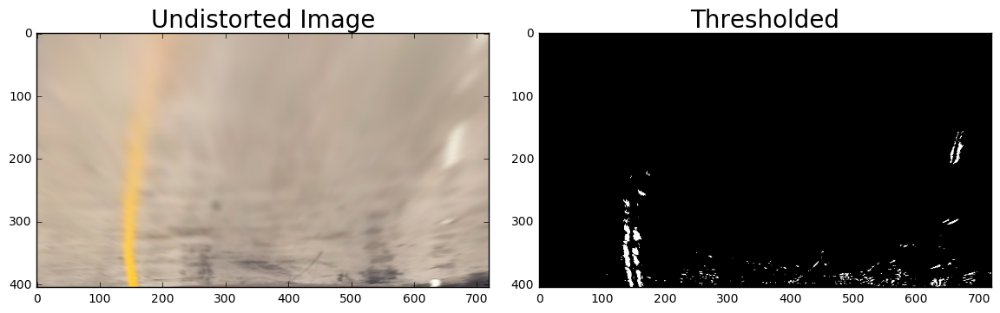

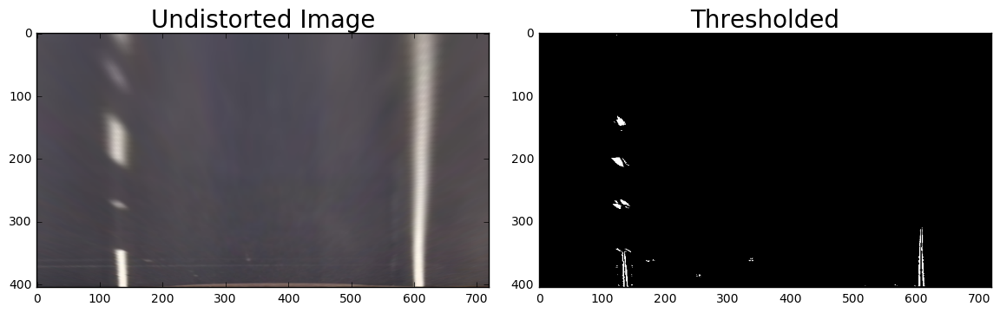

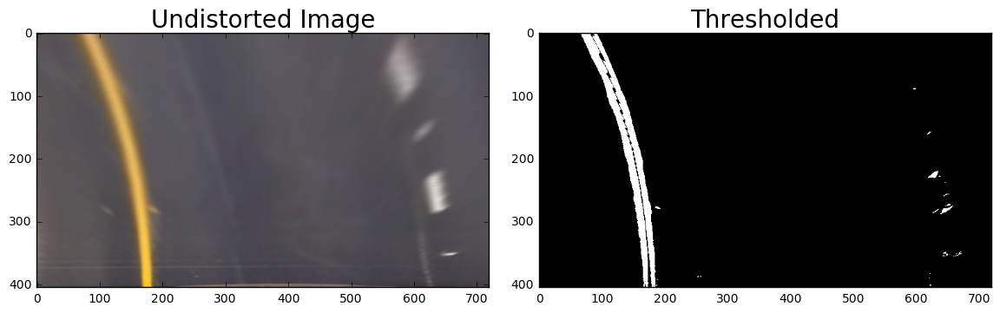

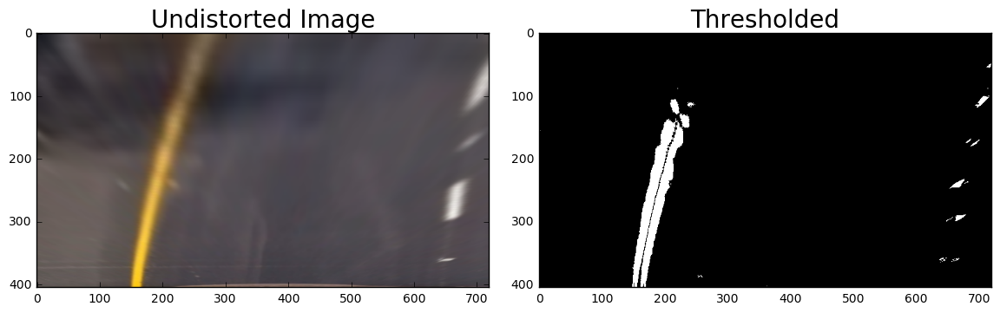

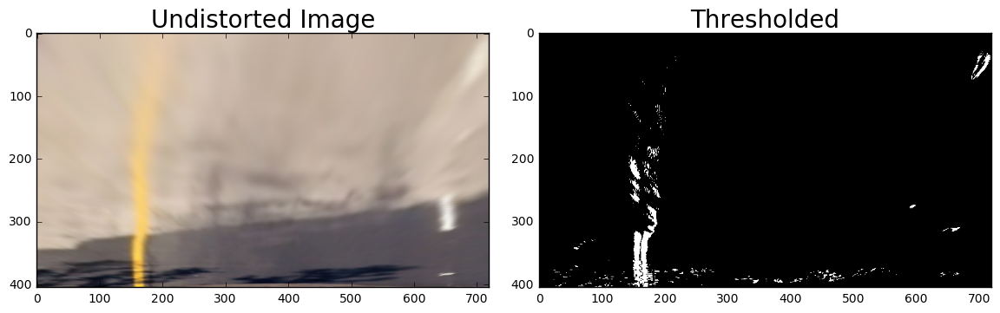

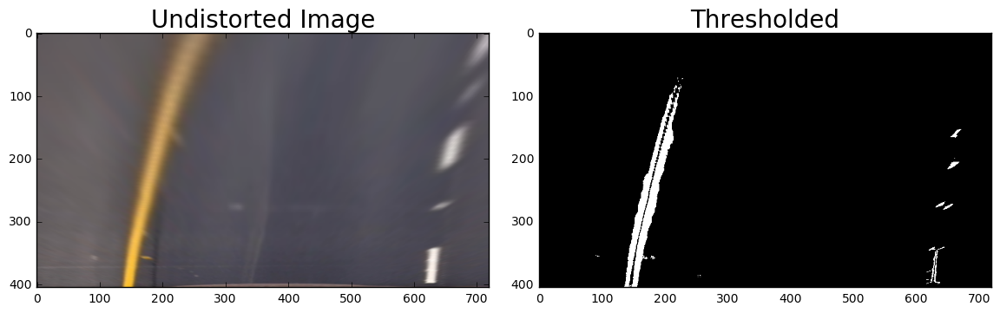

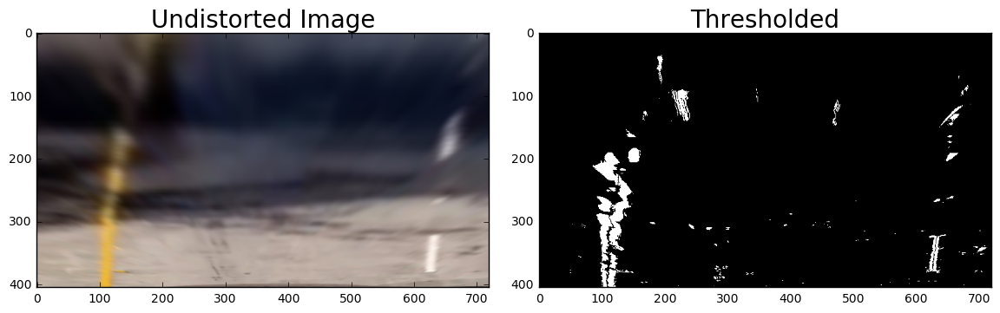

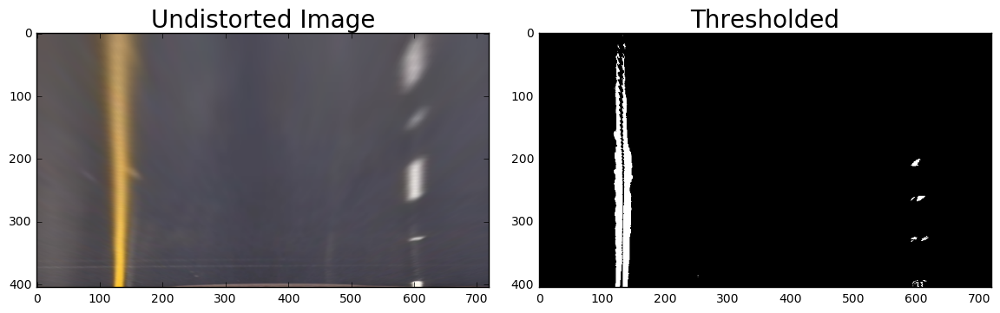

In [25]:
for fname in images:
    fname = os.path.join('test_images',fname)
    img = mpimg.imread(fname)
    img = cv2.resize(img, (720, 405))
    img = cv2.undistort(img, mtx, dist, None, mtx)
    img= cv2.GaussianBlur(img, (3,3), 0)
    #warped = perspective_transform(img, M)
    warped = cv2.warpPerspective(img, M, img_size)
    gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=3, thresh=(10, 230))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=3, thresh=(10, 230))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
    hls_binary = HLS_single(warped, thresh=(90, 255))
    combined = np.zeros_like(dir_binary)
    
    combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[((gradx == 1) & (grady == 1) & hls_binary) | ((mag_binary == 1) & (dir_binary == 1))] = 1  
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    f.tight_layout()
    ax1.imshow(warped)
    ax1.set_title('Undistorted Image', fontsize=20)
    ax2.imshow(combined,cmap='gray' )
    ax2.set_title('Thresholded', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

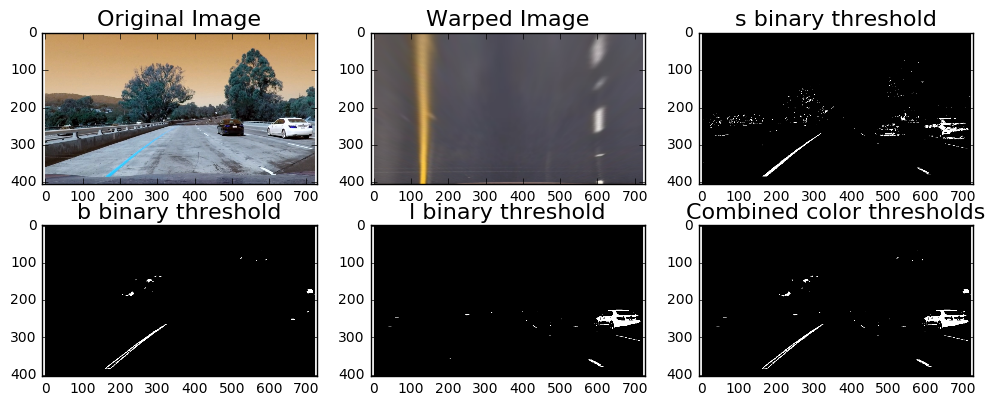

In [26]:
img = cv2.imread('test_images/test1.jpg')
img = cv2.resize(img, (720, 405))
s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]
b_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   
# Threshold color channel
s_thresh_min = 180
s_thresh_max = 255
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
b_thresh_min = 155
b_thresh_max = 200
b_binary = np.zeros_like(b_channel)
b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
l_thresh_min = 225
l_thresh_max = 255
l_binary = np.zeros_like(l_channel)
l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

#color_binary = np.dstack((u_binary, s_binary, l_binary))
combined_binary = np.zeros_like(s_binary)
combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

f, ((ax1, ax2, ax3), (ax4,ax5, ax6)) = plt.subplots(2, 3, sharey='col', sharex='row', figsize=(10,4))
f.tight_layout()
ax1.set_title('Original Image', fontsize=16)
ax1.imshow(img)
ax2.set_title('Warped Image', fontsize=16)
ax2.imshow(warped)
ax3.set_title('s binary threshold', fontsize=16)
ax3.imshow(s_binary, cmap='gray')
ax4.set_title('b binary threshold', fontsize=16)
ax4.imshow(b_binary, cmap='gray')
ax5.set_title('l binary threshold', fontsize=16)
ax5.imshow(l_binary, cmap='gray')
ax6.set_title('Combined color thresholds', fontsize=16)
ax6.imshow(combined_binary, cmap='gray')

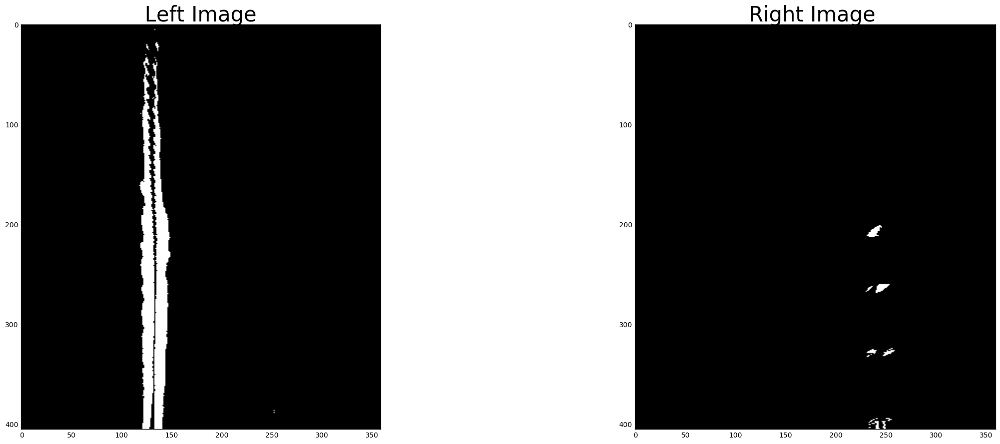

In [27]:
# split half half
img = combined

mid = int(img.shape[1]/2)
img_left = img[:,0:mid-1]
img_right = img[:,mid:1280]
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_left,cmap='gray')
ax1.set_title('Left Image', fontsize=30)
ax2.imshow(img_right, cmap='gray')
ax2.set_title('Right Image ', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

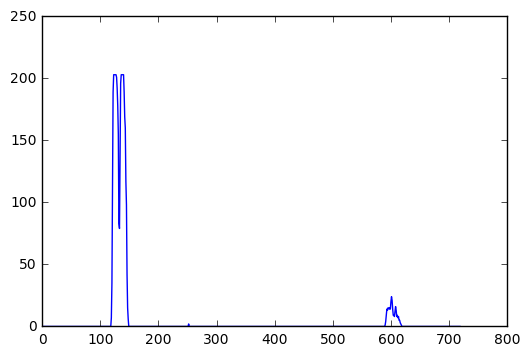

In [28]:
#https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/40ec78ee-fb7c-4b53-94a8-028c5c60b858/concepts/c41a4b6b-9e57-44e6-9df9-7e4e74a1a49a
import numpy as np
img = combined
histogram = np.sum(img[img.shape[0]/2:,:], axis=0)
plt.plot(histogram)

In [29]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
binary_warped=combined
histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

(720, 0)

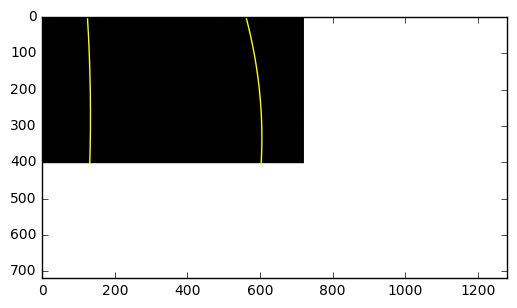

In [30]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [31]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

(720, 0)

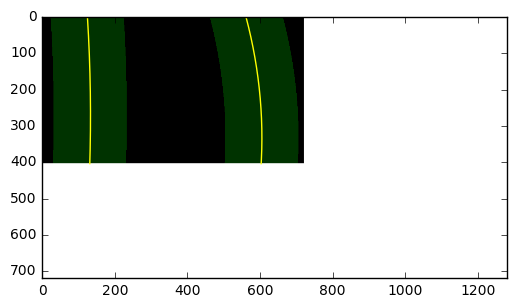

In [32]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/40ec78ee-fb7c-4b53-94a8-028c5c60b858/concepts/a819d5fd-c00e-4e0e-b7d1-c1bee24b12a7

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2

# Read in a thresholded image
#warped = mpimg.imread('warped_example.jpg')
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

In [34]:
#window_centroids = find_window_centroids(combined_binary, window_width, window_height, margin)

In [35]:
# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
	    l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
	    r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
	    # Add graphic points from window mask here to total pixels found 
	    l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
	    r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channle 
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

# Display the final results
plt.imshow(output)
plt.title('window fitting results')
plt.show()

NameError: name 'window_centroids' is not defined

In [36]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def left_right_lane(image):
    # above image is "combined" input
    # Take a histogram of the bottom half of the image
    histogram = np.sum(image[image.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((image,image,image))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #print(leftx_base, rightx_base)
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(image.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = image.shape[0] - np.int((window+1)*window_height)
        win_y_high = image.shape[0] - np.int(window*window_height)
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    return leftx, lefty, rightx, righty, out_img

In [37]:
leftx, lefty, rightx, righty, out_img = left_right_lane(combined)

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)


In [38]:
def c_radius(x1,y1,x2,y2,x3,y3):
    
    # source : http://www.intmath.com/applications-differentiation/8-radius-curvature.php
    m1 = (y2-y1)/(x2-x1)
    m2 = (y3-y2)/(x3-x2)
    
    xc = (m1*m2*(y1-y3)+m2*(x1+x2)-m1*(x2+x3))/(2*(m2-m1))
    yc = -(xc-(x1+x2)/2)/m1+(y1+y2)/2
    
    Radius = np.sqrt((x2-xc)*(x2-xc)+(y2-yc)*(y2-yc))
    
    return m1, m2, xc, yc, Radius

In [39]:
m1, m2, xc, yc, R = c_radius(1,1,2,3, 3,8)
print (m1, m2, xc, yc, R)

2.0 5.0 -10.833333333333334 8.166666666666668 13.834337313


In [51]:
def pipeline(img):
    
    img = cv2.resize(img, (720, 405))
    apex, apey = 360, 258
    offset = 0
    offset_far = 50
    offset_near = 10
    src = np.float32([[int(apex-offset_far),apey],
                  [int(apex+offset_far),apey],
                  [int(0+offset_near),390],
                  [int(720-offset_near),390]])
    dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
    #img = cv2.imread('test_images/straight_lines1.jpg')
    img = cv2.undistort(img, mtx, dist, None, mtx)
    img= cv2.GaussianBlur(img, (3,3), 0)
    img_size = (img.shape[1],img.shape[0])

    M = cv2.getPerspectiveTransform(src, dst)
    Mi = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size)
    gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=3, thresh=(10, 230))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=3, thresh=(10, 230))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
    hls_binary = HLS_single(warped, thresh=(90, 255))
    image = np.zeros_like(dir_binary)
    image[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
          
    leftx, lefty, rightx, righty, out_img = left_right_lane(image)
        
    yvals = np.linspace(0, img.shape[0], num=img.shape[0])

    # Fit a second order polynomial to each lane line
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/405 # meters per pixel in y dimension
    xm_per_pix = 3.7/600 # meteres per pixel in x dimension
    # Define y-value where we want radius of curvature
    # I'll choose 3 y-values(max, mean and min):
    y_eval = np.max(yvals)
    
    y_eval1 = np.max(yvals)
    y_eval2 = np.mean(yvals)
    y_eval3 = np.min(yvals)
    left_fitx_1 = left_fit[0]*y_eval1**2 + left_fit[1]*yvals + left_fit[2]
    left_fitx_2 = left_fit[0]*y_eval2**2 + left_fit[1]*yvals + left_fit[2]
    left_fitx_3 = left_fit[0]*y_eval3**2 + left_fit[1]*yvals + left_fit[2]
    right_fitx_1 = right_fit[0]*y_eval1**2 + right_fit[1]*yvals + right_fit[2]
    right_fitx_2 = right_fit[0]*y_eval2**2 + right_fit[1]*yvals + right_fit[2]
    right_fitx_3 = right_fit[0]*y_eval3**2 + right_fit[1]*yvals + right_fit[2]
    
    
    # Calculated the turning center point xc, yc and radius: 
            
    lm1, lm2, lxc, lyc, lradius = c_radius(left_fitx_1,y_eval1,left_fitx_2,y_eval2,left_fitx_3,y_eval3,)
    l_steering_angle = 4*360/lxc # assume xc <> 0, xc and radius value is very close, xc will show the direction as well
    
    
    rm1, rm2, rxc, ryc, rradius = c_radius(right_fitx_1,y_eval1,right_fitx_2,y_eval2,right_fitx_3,y_eval3,)
     
    r_steering_angle = 4*360/rxc # assume xc <> 0, xc and radius value is very close, xc will show the direction as well
    steering_angle = l_steering_angle + r_steering_angle
    turning_radius = (lradius+rradius)/2 # smooth out the radius
    
    # Find camera position
    left_mean = np.mean(leftx)
    right_mean = np.mean(rightx)
    camera_pos = (combined.shape[1]/2)-np.mean([left_mean, right_mean])

    left_fit_cr = np.polyfit(np.array(lefty,dtype=np.float32)*ym_per_pix, \
                         np.array(leftx,dtype=np.float32)*xm_per_pix, 2)
    right_fit_cr = np.polyfit(np.array(righty,dtype=np.float32)*ym_per_pix, \
                          np.array(rightx,dtype=np.float32)*xm_per_pix, 2)
    
    # Return radius of curvature is in meters
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) \
                             /np.absolute(2*left_fit_cr[0])

    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) \
                                /np.absolute(2*right_fit_cr[0])
      
    
    # Link all points for cv2.fillPoly() in pix space
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    #pts_left = np.array([np.transpose(np.vstack([left_arcx_pt, yvals]))])
    #pts_right = np.array([np.flipud(np.transpose(np.vstack([right_arcx_pt, yvals])))])
    #pts = np.hstack((pts_left, pts_right))
    # pts = np.array([pts], dtype=np.int32)
    
    # Draw the lane onto the warped blank image
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    #color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    cv2.fillPoly(warp_zero, np.int_([pts]), (0,255, 0))
    cv2.polylines(warp_zero, np.array([pts_left], dtype=np.int32), False,(255,0,0),thickness = 15)
    cv2.polylines(warp_zero, np.array([pts_right], dtype=np.int32), False,(0,0,255),thickness = 15)
    font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    #cv2.putText(img,'Left curve' + ' ' + str(left_curverad)[:6] + 'm',(10,60), font, 1,(255,255,255),1)
    cv2.putText(img,'Camera Position' + ' ' + str(camera_pos*xm_per_pix)[:6] + 'm',(10,30), font, 1,(255,255,255),1)
    cv2.putText(img,'Turning Radius ' +str(turning_radius)[:6] + 'm' ,(10,60), font, 1,(255,255,255),1)
    cv2.putText(img,'Steering Angle '+'{:.6}'.format(str(steering_angle)) + ' deg',(10,90), font, 1,(255,255,255),1)
    
    # Warp back to original view
    unwarp =cv2.warpPerspective(warp_zero, Mi,img_size)
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, unwarp, 0.3, 0)
    #result = cv2.resize(result, (720, 405))

    return result

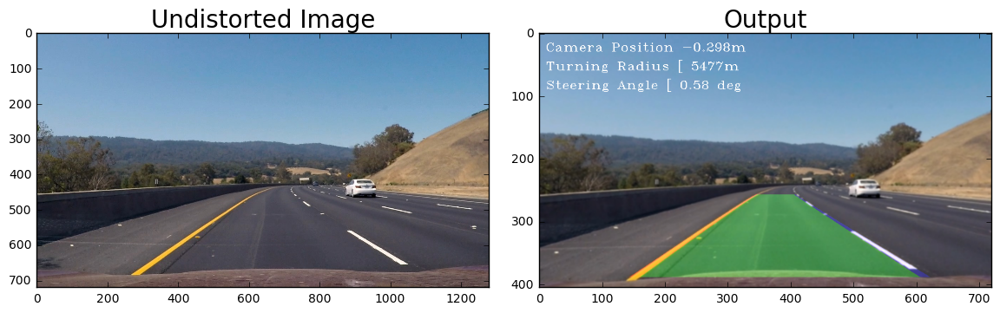

In [52]:
# Read in an image
image = mpimg.imread('test_images/test3.jpg')

result = pipeline(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(result,cmap='gray' )
ax2.set_title('Output', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [53]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [01:41<00:00, 11.82it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 5min 9s, sys: 2.23 s, total: 5min 11s
Wall time: 1min 41s


In [56]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'challenge_video_output.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [00:41<00:00, 12.41it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 2min 3s, sys: 952 ms, total: 2min 4s
Wall time: 41.9 s


In [57]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'harder_challenge_video_output.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [01:48<00:00, 11.05it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 5min 28s, sys: 2.06 s, total: 5min 30s
Wall time: 1min 48s


In [ ]:
# Define a function that thresholds the S-channel of HLS
def HLS_single(img,M,thresh=(0, 255)):
    s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]

    b_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   

    # Threshold color channel
    s_thresh_min = 180
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

    #color_binary = np.dstack((u_binary, s_binary, l_binary))
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1
    return combined_binary